In [1]:
# перед началом делаем все необходимые импорты библиотек
import torch
import torch.nn as nn

import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms 
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
# поскольку для выполнения этой тетрадки необходим GPU, задание выполнялось в Google Colab 
# монтируем гугл диск
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Задание 1

Обучите свёрточную генеративную модель (с использованием DCGAN) на изображениях цифр из датасета MNIST. Генератор G должен синтезировать случайные изображения цифр x по некоторому входному латентному вектору h, который семплируется из нормального распределения. \
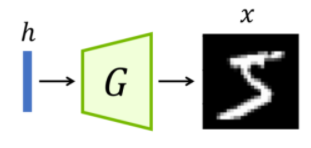

**Решение:** \
Изначально идея DCGAN была описана в статье: \
 https://arxiv.org/abs/1511.06434 \
 \
 Авторы для генерации изображений предложили использовать сверточные сети (CNN) вместо полносвязных (Fully-connected), что использовались до этого. Это позволило достичь намного лучшего качества работы модели по сравнению с предыдущими результатами других моделей. \
 \
 Самой важной составляющей той статьи была следующая модель генератора:
  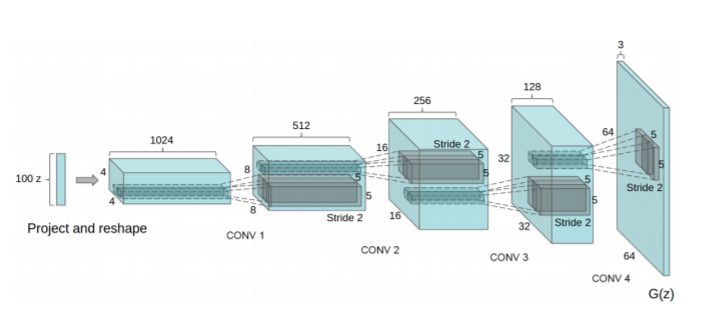
  \
  Генератор принимает вектор на вход, после этого он увеличивает масштаб изображения до 1024 каналов с шириной и высотой 4 на 4, затем 512x4x4, и продолжает так делать до тех пор, пока изображение не превратится в 3-канальное (RGB) размером 64x64 пикселей.
  Дискриминатор в свою очередь выглядит так же, как генератор, но "в обратном порядке". \
  \
  Примечательно, что в модели не используется pooling-слои,  нет fully-connected слоев. В дискриминаторе и генераторе используется нормализация батчей, а функция активации ReLU и LeakyReLU для генератора и дискриминатора соотвтетственно. (На выходном слое генератора используется гиперболический тангенс).

In [3]:
class Discriminator(nn.Module):
  '''
  Модель дискриминатора в GAN-ах нужна для определения того, 
  была ли картинка изначально в датасете (real) 
  или же она была создана генератором (fake)
  '''
  def __init__(self, channels_img, features_d):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        # Размерность изображения на входе: N (batch size) * channels_img * 64 * 64
        nn.Conv2d(channels_img, features_d, kernel_size =4, stride =2, padding = 1), # 32 * 32
        nn.LeakyReLU(0.2),
        self._block(features_d, features_d*2, 4, 2, 1), # 16 * 16
        self._block(features_d*2, features_d*4, 4, 2, 1), # 8 * 8
        self._block(features_d*4, features_d*8, 4, 2, 1), # 4 * 4
        nn.Conv2d(features_d*8, 1, kernel_size=4, stride=2, padding=0), # 1 * 1
        nn.Sigmoid()
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    '''
    Метод _block был создан, чтобы уменьшить объем кода в дискрминаторе, 
    поскольку последовательность действий, описанных в этом методе, 
    повторяется в модели дискриминатора несколько раз
    '''
    return nn.Sequential(
        nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias = False),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2),
    )

  def forward(self, x):
    return self.disc(x)

In [4]:
class Generator(nn.Module):
  '''
  Модель генератора учится создавать изображения такими,
  чтобы дискриминатор не мог определить, были ли они изначально
  в датасете (real) или же созданы генератором (fake)
  '''
  def __init__(self, z_dim, channels_img, features_g):
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        # Размерность изображения на входе: N (batch size) * z_dim * 1 * 1
        self._block(z_dim, features_g*16, 4, 1, 0), # N * f_g*16 * 4 * 4
        self._block(features_g*16, features_g*8, 4, 2, 1), # 8 * 8 
        self._block(features_g*8, features_g*4, 4, 2, 1), # 16 * 16 
        self._block(features_g*4, features_g*2, 4, 2, 1), # 32 * 32 
        nn.ConvTranspose2d(
            features_g*2, channels_img, kernel_size = 4, stride = 2, padding = 1,
        ),
      nn.Tanh(), # [-1, 1]
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    
    #Метод _block был создан, чтобы уменьшить объем кода в генераторе, 
    #поскольку последовательность действий, описанных в этом методе, 
    #повторяется в модели генератора несколько раз
      return nn.Sequential(
          nn.ConvTranspose2d(
              in_channels,
              out_channels,
              kernel_size,
              stride,
              padding,
              bias = False,
          ),
          nn.BatchNorm2d(out_channels),
          nn.ReLU(),
      )

  def forward(self, x):
    return self.gen(x)


In [5]:
def initialize_weights(model):
  '''
  Данная функция позволяет инициализировать веса для обеих моделей.
  Она создана с параметрами, описанными в статье про DCGAN 
  (Среднее = 0, Стандартное отклонение = 0.02)
  '''
  for m in model.modules():
    # проверка инициализации
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data, 0.0, 0.02)

def test():
  '''
  Функция, которая необходима для тестирования, правильно ли написаны модели
  генератора и дискриминатора
  '''
  
  # инициализируем параметры
  N, in_channels, H, W = 8, 3, 64, 64
  z_dim = 100
  x = torch.randn((N, in_channels, H, W))
  
  # объявляем дискриминатор и инициализируем его веса
  disc = Discriminator(in_channels, 8)
  initialize_weights(disc)
  assert disc(x).shape == (N, 1, 1, 1)
  
  # объявляем генератор и инициализируем его веса
  gen = Generator(z_dim, in_channels, 8)
  initialize_weights(gen)
  z = torch.randn((N, z_dim, 1, 1))
  assert gen(z).shape == (N, in_channels, H, W)
  
  # если все ок, то выводим сообщение, что все прошло успешно
  print("Successfully!")

In [6]:
# запускаем функцию тестирования
test()

Successfully!


In [7]:
# проверяем, есть ли подключение к GPU
# наличие GPU позволит значительно ускорить обучение всех наших моделей
!nvidia-smi

Wed May 25 11:06:44 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [8]:
# объявляем гиперпараметры для обучения DCGAN
# все гиперпараметры взяты по образцу и подобию оригинальной статьи DCGAN (см ссылку выше)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

LEARNING_RATE = 2e-4
BATCH_SIZE = 128
IMAGE_SIZE = 64
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64

In [9]:
# раскомментировать для очистки Tensor Board
#!rm -rf ./logs/

In [10]:
# запуск Tensor Board
%load_ext tensorboard
import os
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

In [11]:
# загрузка датасета с масштабированием, преобразованием в torch tensor и нормализацией
transformation = transforms.Compose(
    [
     transforms.Resize(IMAGE_SIZE),
     transforms.ToTensor(),
     transforms.Normalize(
         [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]),
     ]
)

dataset = datasets.MNIST(root="dataset/", train = True, transform = transformation, download = True)

#создаем лоадеры, которые будут "подсовывать" данные для обучения в нашу модель
loader = DataLoader(dataset, batch_size = BATCH_SIZE, shuffle = True)

# инциализация генератора и дискриминатора
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [12]:
# инциализация весов генератора и дискриминатора
initialize_weights(gen)
initialize_weights(disc)

# объявление оптимизатора (взят Adam, как в статье) и целевой функции
opt_gen = optim.Adam(gen.parameters(), lr = LEARNING_RATE, betas = (0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr = LEARNING_RATE, betas = (0.5, 0.999))
criterion = nn.BCELoss()

# объявим "шум", чтобы видеть прогресс обучения
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

# запись в Tensor Board
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")
step = 0

# установка моделей в режим обучения
gen.train()
disc.train()

# процесс обучения моделей
for epoch in range(NUM_EPOCHS):
  for batch_idx, (real, _) in enumerate(loader): # второй параметр в tuple при enumerate не нужен, поскольку обучение GAN-ов является unsupervised
    real = real.to(device)
    noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
    fake = gen(noise)

    # ОБУЧЕНИЕ ДИСКРИМИНАТОРА max log(D(x)) + log(1 - D(G(z)))
    disc_real = disc(real).reshape(-1) 
    loss_disc_real  = criterion(disc_real, torch.ones_like(disc_real))
    disc_fake = disc(fake).reshape(-1)
    loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    loss_disc = (loss_disc_real + loss_disc_fake) / 2
    disc.zero_grad()
    loss_disc.backward(retain_graph = True) # используем retain_graph = True, т.к. хотим использовать fake-изображение далее в обучении генератора
    opt_disc.step()

    # ОБУЧЕНИЕ ГЕНЕРАТОРА min log(1 - D(G(z))) <--> max log(D(G(z)))
    output = disc(fake).reshape(-1)
    loss_gen = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()

    # Вывод лосса и его дублирование в Tensor board
    if batch_idx % 100 == 0:
      print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Batch {batch_idx}/{len(loader)}")

      with torch.no_grad():
        fake = gen(fixed_noise)
        # выводит (до) 32 примеров изображений

        img_grid_real = torchvision.utils.make_grid(
            real[:32], normalize = True)
        img_grid_fake = torchvision.utils.make_grid(
            fake[:32], normalize = True)

        writer_real.add_image("Real", img_grid_real, global_step = step)
        writer_fake.add_image("Fake", img_grid_fake, global_step = step)

      step += 1


Epoch 1/5, Batch 0/469
Epoch 1/5, Batch 100/469
Epoch 1/5, Batch 200/469
Epoch 1/5, Batch 300/469
Epoch 1/5, Batch 400/469
Epoch 2/5, Batch 0/469
Epoch 2/5, Batch 100/469
Epoch 2/5, Batch 200/469
Epoch 2/5, Batch 300/469
Epoch 2/5, Batch 400/469
Epoch 3/5, Batch 0/469
Epoch 3/5, Batch 100/469
Epoch 3/5, Batch 200/469
Epoch 3/5, Batch 300/469
Epoch 3/5, Batch 400/469
Epoch 4/5, Batch 0/469
Epoch 4/5, Batch 100/469
Epoch 4/5, Batch 200/469
Epoch 4/5, Batch 300/469
Epoch 4/5, Batch 400/469
Epoch 5/5, Batch 0/469
Epoch 5/5, Batch 100/469
Epoch 5/5, Batch 200/469
Epoch 5/5, Batch 300/469
Epoch 5/5, Batch 400/469


In [13]:
# Сохранение весов генератора (раскомментировать в случае необходимости)
#torch.save(gen.state_dict(), "/content/gen_weights.pth")

In [14]:
# Загрузка весов генератора (раскомментировать в случае необходимости)
#gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
#gen.load_state_dict(torch.load("/content/gen_weights.pth"))
#gen.eval()

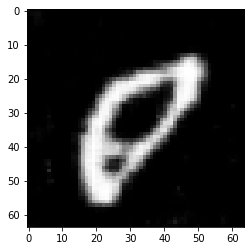

In [15]:
# покажем работоспособность генератора на простом примере
# создадим рандомный вектор h и подадим на вход генератора
h_random = torch.randn(1, Z_DIM, 1, 1).to(device)
img_generator = gen(h_random)
plt.imshow(img_generator.cpu().detach().numpy().reshape(-1,64,64)[0], cmap="gray")

# Задание 2.1

Создайте процедуру E получения латентного вектора h по входному изображению с цифрой x (при условии полученного ранее фиксированного генератора G) \
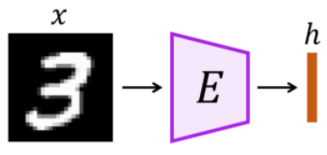

Вектор h должен получиться таким, чтобы при подаче на вход в генератор G, он выдавал изображение изначально заданной цифры x. \

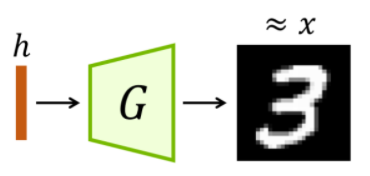

Продемонстрируйте, что это условие выполняется.

Реализуйте два варианта решения Части 2:

[2.1] Через создание универсальной Feed-Forward модели h = E(x)

**Решение:** \
В данном случае можно воспользоваться понятием Автоэнкодера, который обычно состоит из Энкодера и Декодера. Автоэнкодер - это искусственная нейронная сеть, цель которой - научиться восстанавливать данные. \
Автоэнкодеры выглядят вот так: \
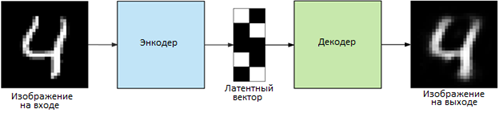

Подробнее об автоэнкодерах: \
https://medium.com/machine-learning-researcher/auto-encoder-d942a29c9807 \
\
Только в решении Декодер будет заменен на предварительно созданный и обученный Генератор из DCGAN. \
Используем в качестве энкодера обычные линейные преобразования с функцией активации ReLU.

In [16]:
# Автоэнкодер (Энкодер-Генератор)
class AE(nn.Module):
  def __init__(self, input_shape):
    super(AE, self).__init__()
    
    # слои энкодера
    self.fc_layer1 = nn.Linear(in_features = input_shape, out_features=Z_DIM * 2, bias=False)
    self.activation = nn.ReLU()
    self.fc_layer2 = nn.Linear(in_features = Z_DIM * 2, out_features=Z_DIM, bias=False)

  def forward(self, x):
    # проход через энкодер
    encoded = self.fc_layer1(x)
    activated = torch.relu(encoded)
    hid = self.fc_layer2(activated)
    
    # проход через генератор
    out = gen(hid.view(-1, Z_DIM, 1, 1))

    return out 

In [17]:
# объявление модели Энкодер-Генератор (Генератор зафиксирован - параметры не обучаются)
m = AE(input_shape = 64*64).to(device)
print(m)

AE(
  (fc_layer1): Linear(in_features=4096, out_features=200, bias=False)
  (activation): ReLU()
  (fc_layer2): Linear(in_features=200, out_features=100, bias=False)
)


In [18]:
# выбор оптимизатора и лосс-функции
optimizer = optim.Adam(m.parameters(), lr=1e-3)
criterion = nn.MSELoss()

In [19]:
# проводим такие же трансформирования над датасетом
# отличие состоит в том, что есть разбиение на тестовую и обучающую выборки
transform = transforms.Compose(
    [
     transforms.Resize(IMAGE_SIZE),
     transforms.ToTensor(),
     transforms.Normalize(
         [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]),
     ]
)

train_dataset = torchvision.datasets.MNIST(
    root="~/torch_datasets", train=True, transform=transform, download=True
)

test_dataset = torchvision.datasets.MNIST(
    root="~/torch_datasets", train=False, transform=transform, download=True
)

train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=128, shuffle=True, num_workers=2, pin_memory=True
)

test_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=32, shuffle=False, num_workers=2
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting /root/torch_datasets/MNIST/raw/train-images-idx3-ubyte.gz to /root/torch_datasets/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting /root/torch_datasets/MNIST/raw/train-labels-idx1-ubyte.gz to /root/torch_datasets/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting /root/torch_datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to /root/torch_datasets/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting /root/torch_datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to /root/torch_datasets/MNIST/raw



In [20]:
# для обучения выбираем количество эпох
epochs = 20

for epoch in range(epochs):
    loss = 0
    for batch_features, _ in train_loader:
        # решейп данных батча в матрицу с размерностью [N, 64*64]
        # загрузка в девайс (CPU/GPU)
        batch_features = batch_features.view(-1, 64*64).to(device)
        
        # Сброс градиента в 0
        # PyTorch накапливает градиенты при последующих backward-ах
        optimizer.zero_grad()
        
        # вычисление реконструированных изображений
        outputs = m(batch_features)

        # вычисление ошибки тренировки
        batch_features = batch_features.view(-1, 1, 64, 64)
        train_loss = criterion(outputs, batch_features)
        
        # вычисление накопленного грандиента
        train_loss.backward()
        
        # обновление параметров, основываясь на текущих градиентах
        optimizer.step()
        
        # лосс за эпоху на батче
        loss += train_loss.item()
    
    # лосс за эпоху обучения
    loss = loss / len(train_loader)
    
    # вывод ошибки за эпоху
    print("epoch : {}/{}, loss = {:.6f}".format(epoch + 1, epochs, loss))

epoch : 1/20, loss = 0.117410
epoch : 2/20, loss = 0.050089
epoch : 3/20, loss = 0.042406
epoch : 4/20, loss = 0.038897
epoch : 5/20, loss = 0.036908
epoch : 6/20, loss = 0.035464
epoch : 7/20, loss = 0.034246
epoch : 8/20, loss = 0.033356
epoch : 9/20, loss = 0.032354
epoch : 10/20, loss = 0.032199
epoch : 11/20, loss = 0.031484
epoch : 12/20, loss = 0.031023
epoch : 13/20, loss = 0.030807
epoch : 14/20, loss = 0.030276
epoch : 15/20, loss = 0.029922
epoch : 16/20, loss = 0.029776
epoch : 17/20, loss = 0.029527
epoch : 18/20, loss = 0.029122
epoch : 19/20, loss = 0.028912
epoch : 20/20, loss = 0.028833


In [21]:
# Сохранение весов Энкодера (раскомментировать в случае необходимости)
#torch.save(m.state_dict(), "/content/encoder_weights.pth")

In [22]:
# Загрузка весов Энкодера (раскомментировать в случае необходимости)
#m = AE(input_shape = 64*64).to(device)
#m.load_state_dict(torch.load("/content/encoder_weights.pth"))
#m.eval()

Необходимо продемонстрировать работоспособность модели. Для этого было решено вручную собрать тензор из 4 изображений из датасета MNIST:

In [23]:
# выбор изображений из датасета MNIST (можно произвольно указать число от 0 до 60 000)
img_num1 = 777
img_num2 = 8697
img_num3 = 34903
img_num4 = 1832

# тестовый тензор, состоящий из 4 изображений, взятых из MNIST
test_tensor = torch.cat((dataset[img_num1][0], 
                         dataset[img_num2][0], 
                         dataset[img_num3][0], 
                         dataset[img_num4][0]), 
                        dim=0)
print(test_tensor.shape)

torch.Size([4, 64, 64])


In [24]:
# проверка работы модели Энкодер-Генератор
res = m(test_tensor.view(-1,64*64).to(device))
print(res.shape)

torch.Size([4, 1, 64, 64])


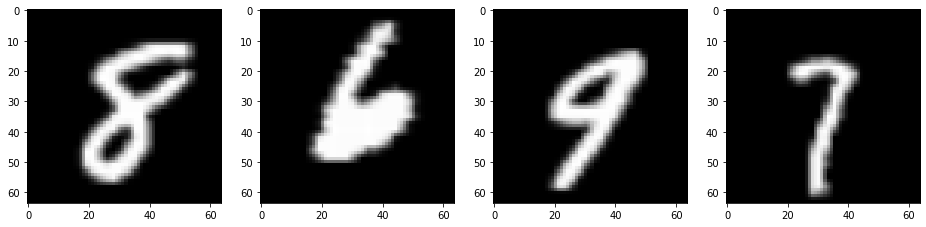

In [25]:
# оригинальное изображение, взятое из датасета MNIST
plt.figure(figsize = (16,4))
plt.subplot(141)
plt.imshow(test_tensor.cpu().detach().numpy().reshape(-1,64,64)[0], cmap="gray")
plt.subplot(142)
plt.imshow(test_tensor.cpu().detach().numpy().reshape(-1,64,64)[1], cmap="gray")
plt.subplot(143)
plt.imshow(test_tensor.cpu().detach().numpy().reshape(-1,64,64)[2], cmap="gray")
plt.subplot(144)
plt.imshow(test_tensor.cpu().detach().numpy().reshape(-1,64,64)[3], cmap="gray")

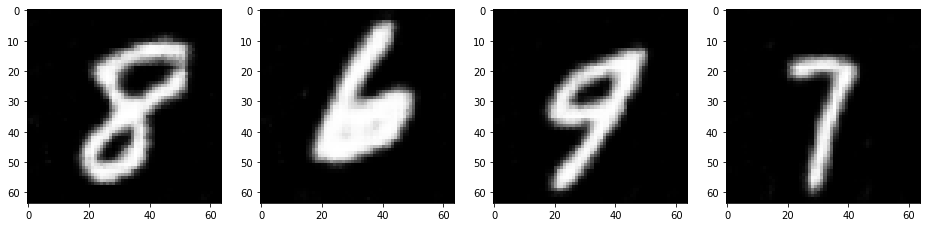

In [26]:
# восстановленное изображение с помощью модели Энкодер-Генератор
plt.figure(figsize=(16,4))
plt.subplot(141)
plt.imshow(res.cpu().detach().numpy().reshape(-1,64,64)[0], cmap="gray")
plt.subplot(142)
plt.imshow(res.cpu().detach().numpy().reshape(-1,64,64)[1], cmap="gray")
plt.subplot(143)
plt.imshow(res.cpu().detach().numpy().reshape(-1,64,64)[2], cmap="gray")
plt.subplot(144)
plt.imshow(res.cpu().detach().numpy().reshape(-1,64,64)[3], cmap="gray")

# Задание 2.2

[2.2] Через оптимизационный поиск h по данному x.

Пояснение: Необходимо создать функцию, которая на вход принимает x (изображение цифры из датасета MNIST) и возвращает вектор h. Полученный вектор h должен удовлетворять следующему условию: если мы подаем h в полученный ранее (фиксированный) генератор G, то мы должны получить изображение, близкое к исходному x. Внутри функции, которую необходимо создать, вектор h должен получаться с помощью некоторого оптимизационного (итерационного) процесса (процесс поиска h

запускается для каждого входного x), а не с помощью Feed-Forward модели, как в пункте [2.1]

In [27]:
# целевое изображение выберем из ранее созданного test_tensor (от 0 до 3, тк 4 изображения в данном тензоре)
img_opt_num = 0
img_opt = test_tensor[img_opt_num].to(device)

In [28]:
# создадим функцию, которая на вход будет принимать изображение, а возвращать вектор h
def inv_gan(img):

  # создание вектора h, который необходимо восстановить
  h3 = torch.randn(1, Z_DIM, 1, 1, requires_grad=True, device=device)

  # объявление оптимизиатора и лосс-функции
  optimizator = optim.Adam([h3], lr=1e-3)
  criteriy = nn.MSELoss()

  # решение задачи оптимизации
  # взводим лосс в большое значение (здесь: 10) и включаем счетчик итераций (i)
  loss = torch.tensor(10)
  i = 0

  # процесс оптимизации будет идти до тех пор, пока модуль ошибки не станет меньше выбранной величины (0.015)
  while torch.abs(loss) > 0.015:
      
      # сброс градиента в 0
      optimizator.zero_grad()
          
      # вычисление восстановленного изображения
      output = gen(h3)

      # вычисление ошибки восстановления (лосс)
      loss = criteriy(output, img)
          
      # вычисление накопленного градиента
      loss.backward()
          
      # обновление параметра, основываясь на текущем градиенте
      optimizator.step()  
      
      # вывод некоторых лоссов и итераций
      if i % 250 == 0:
        print(f"Iteration {i} , loss = {loss.item():.4f}")
      i+=1

  # отображение финального результата (итерация и лосс)
  print(f"Iteration {i} , loss = {loss.item():.5f}")

  return h3

In [29]:
# Проверка того, какое изображение получается из найденного вектора h
h_vector = inv_gan(img_opt)
check3 = gen(h_vector)

Iteration 0 , loss = 0.5400
Iteration 250 , loss = 0.3708
Iteration 500 , loss = 0.1901
Iteration 750 , loss = 0.0553
Iteration 1000 , loss = 0.0308
Iteration 1250 , loss = 0.0215
Iteration 1500 , loss = 0.0189
Iteration 1750 , loss = 0.0171
Iteration 2000 , loss = 0.0155
Iteration 2076 , loss = 0.01500


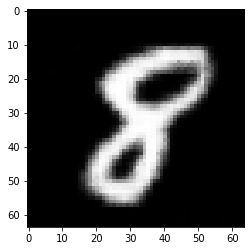

In [30]:
plt.imshow(check3.cpu().detach().numpy().reshape(64,64), cmap="gray")

# Результаты

Text(0.5, 1.0, 'Inv GAN image')

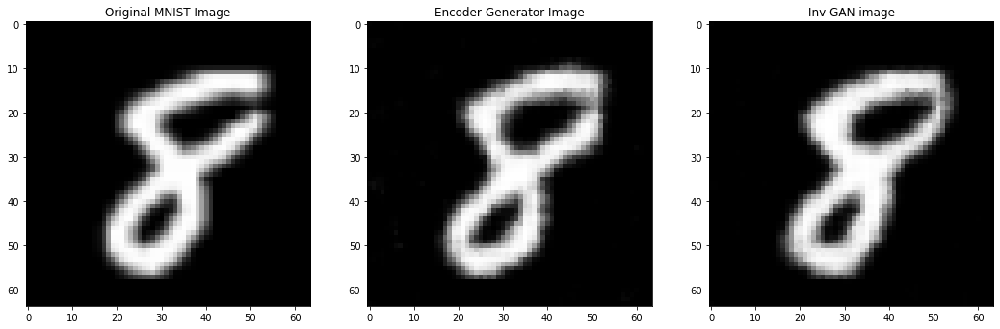

In [31]:
# Продемонстрируем результаты проделанной работы для отдельно взятого числа на всех моделях

plt.figure(figsize = (18,6))
plt.subplot(131)
plt.imshow(test_tensor.cpu().detach().numpy().reshape(-1,64,64)[img_opt_num], cmap="gray")
plt.title("Original MNIST Image")

plt.subplot(132)
plt.imshow(res.cpu().detach().numpy().reshape(-1,64,64)[img_opt_num], cmap="gray")
plt.title("Encoder-Generator Image")

plt.subplot(133)
plt.imshow(check3.cpu().detach().numpy().reshape(64,64), cmap="gray")
plt.title("Inv GAN image")

На полученных изображениях легко заметить, что цифры незначительно отличаются между собой, но представляют собой то же самое числовое значение. Это свидетельствует о том, что изображения Encoder-Generator Image и Inversed GAN image были успешно восстановлены из вектора h, полученного путем обучения модели [2.1] и путем оптимизационного поиска [2.2]. \
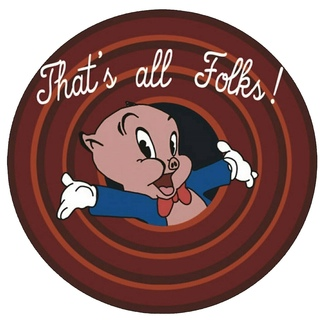